In [7]:
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [16]:
df = pd.read_csv('/content/drive/MyDrive/NetworkScience/edgelist.csv')
df

,Unnamed: 0,Source,Target,Weight
0,0,mental,health,32576
1,1,#mentalhealthawarenessmonth,mental,23650
2,2,#mentalhealthawarenessmonth,health,21990
3,3,#mentalhealth,#mentalhealthawarenessmonth,13231
4,4,#mentalhealthawarenessmonth,may,8809
...,...,...,...,...
695,695,#mentalhealthawarenessmonth,hear,503
696,696,#mentalhealthawarenessmonth,article,503
697,697,mental,blog,503
698,698,care,help,500


In [17]:
G = nx.from_pandas_edgelist(df, 'Source', "Target", "Weight")

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 128154 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 128154 missing from current font.
  font.set_text(s, 0, flags=flags)


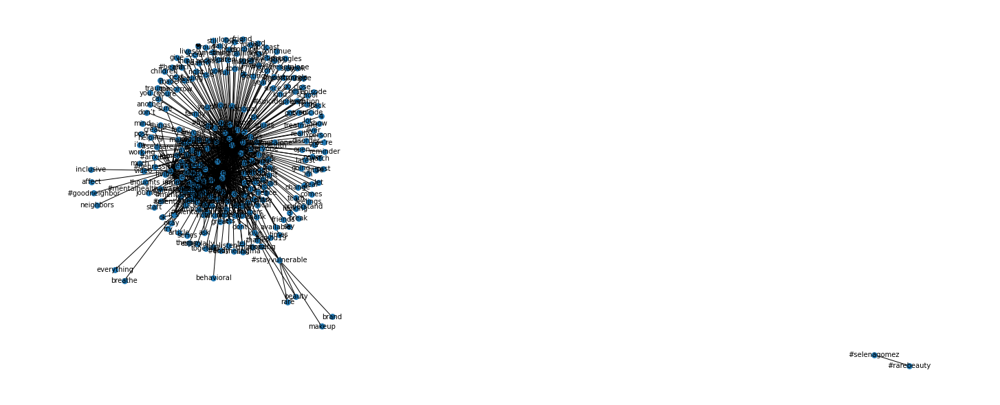

In [154]:
plt.figure(figsize=(20,8))
nx.draw(G,pos=nx.spring_layout(G),with_labels=True,font_size=10,node_size=60)
plt.show()

{'mental': 0.06881483308096337, 'health': 0.06319345854049063, '#mentalhealthawarenessmonth': 0.21717764691678357, '#mentalhealth': 0.020990391515763335, 'may': 0.01340529858769664, 'can': 0.027194309356832043, '#mentalhealthmatters': 0.008203431211632162, 'amp': 0.012280866389862682, 'help': 0.01611133750248413, 'awareness': 0.005798065406572268, 'month': 0.0052844669011914485, 'us': 0.006615883203939256, 'support': 0.006133810142923086, 'people': 0.005833821269866335, 'take': 0.005722182989595607, '#mentalhealthawareness': 0.00397140066722715, 'know': 0.004925365298183284, 'time': 0.005245351803563509, 'just': 0.004951015548299315, 'day': 0.004955900763165412, 'care': 0.006124020294475204, 'need': 0.005825002920570235, 'will': 0.004331415406062638, 'illness': 0.002633076647471041, 'today': 0.004421188044183305, 'one': 0.004505526762231149, 'it’s': 0.008218642758927303, 'check': 0.00395773863184636, 'life': 0.003118098926674822, 'get': 0.003963679126544881, 'important': 0.003068318715

<BarContainer object of 50 artists>

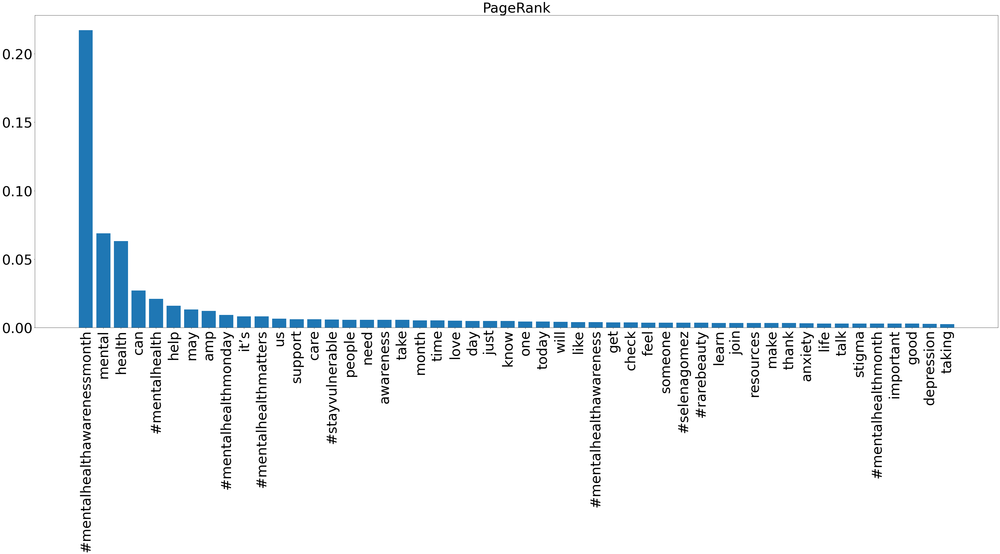

In [111]:
dict_pagerank=nx.pagerank(G)
print(dict_pagerank)
#sort pagerank dictionary by its values 
show_dict=dict(sorted(dict_pagerank.items(), key=lambda x: x[1], reverse=True))
#take only 20 items with higher values 
show_dict=dict(list(show_dict.items())[:50])

keys = show_dict.keys()
values = show_dict.values()

plt.figure(figsize=(60, 20))
plt.title('PageRank',size=48)
plt. xticks(rotation=90,size=48)
plt. yticks(size=48)
plt.bar(keys, values,)
#uncomment next line to save the picture of this figure
#plt.savefig('plot_pagerank.png')

{'mental': 0.07279684022657748, 'health': 0.06521580827794285, '#mentalhealthawarenessmonth': 0.8238106431701232, '#mentalhealth': 0.005223520025037001, 'may': 0.0010118795993322182, 'can': 0.034054433230515053, '#mentalhealthmatters': 0.0005330213846660479, 'amp': 0.0010624658678507646, 'help': 0.002759561852097673, 'awareness': 5.29130296284315e-05, 'month': 1.5471493772723756e-05, 'us': 0.00025117917700965094, 'support': 0.00021789202374106247, 'people': 0.00027000599052974246, 'take': 0.00019696583665103197, '#mentalhealthawareness': 0.0001874417689541477, 'know': 1.2892911477269798e-05, 'time': 0.0001894252937968046, 'just': 0.0002485971457279983, 'day': 0.00022504609409618523, 'care': 0.0002776934779719648, 'need': 7.346913048158503e-05, 'will': 0.0001894252937968046, 'illness': 0.0, 'today': 0.00020355790830073493, 'one': 5.264605519885167e-05, 'it’s': 0.01452989784311824, 'check': 0.0, 'life': 0.0, 'get': 0.0, 'important': 0.0, '#mentalhealthmonday': 0.00045021935251686956, 'li

<BarContainer object of 50 artists>

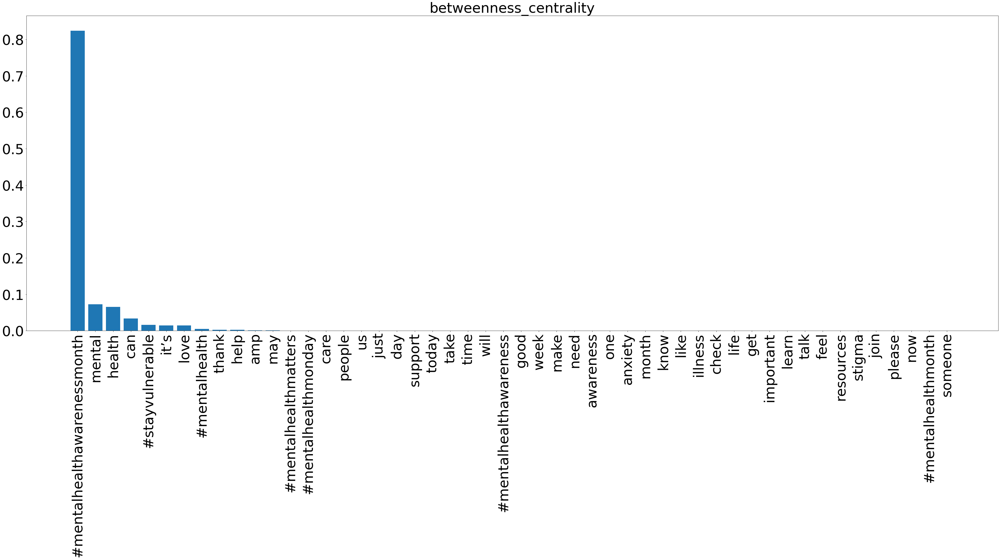

In [110]:
dict_betweenness_centrality=nx.betweenness_centrality(G)
print(dict_betweenness_centrality)
#sort betweenness_centrality dictionary by its values 
show_dict=dict(sorted(dict_betweenness_centrality.items(), key=lambda x: x[1], reverse=True))
#take only 20 items with higher values 
show_dict=dict(list(show_dict.items())[:50])
print(show_dict)

keys = show_dict.keys()
values = show_dict.values()

plt.figure(figsize=(60, 20))
plt.title('betweenness_centrality',size=48)
plt. xticks(rotation=90,size=48)
plt. yticks(size=48)
plt.bar(keys, values)

#uncomment next line to save the picture of this figure
#plt.savefig('plot_betweenness_centrality.png')

In [101]:
from community import community_louvain

def community_layout(g, partition):
    """
    Compute the layout for a modular graph.


    Arguments:
    ----------
    g -- networkx.Graph or networkx.DiGraph instance
        graph to plot

    partition -- dict mapping int node -> int community
        graph partitions


    Returns:
    --------
    pos -- dict mapping int node -> (float x, float y)
        node positions

    """

    pos_communities = _position_communities(g, partition, scale=3.)

    pos_nodes = _position_nodes(g, partition, scale=1.)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos
def _position_communities(g, partition, **kwargs):

    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.circular_layout(hypergraph, **kwargs)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos


/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 128154 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 128154 missing from current font.
  font.set_text(s, 0, flags=flags)


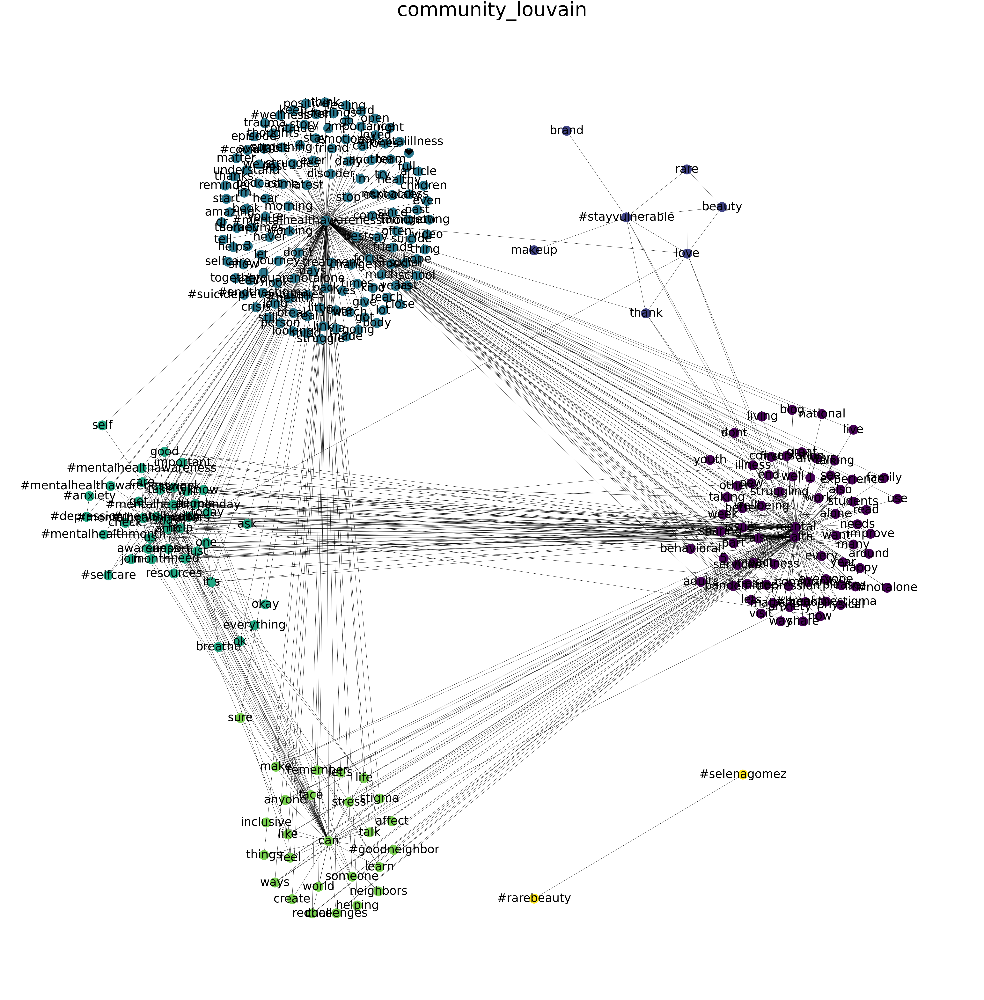

In [114]:
plt.figure(figsize=(70, 70))
partition = community_louvain.best_partition(G)
pos = community_layout(G, partition)

nx.draw(G, pos,with_labels=True,node_size=2500,font_size=60, node_color=list(partition.values())) 
plt.title('community_louvain',size=100)
plt.show()
#uncomment next line to save the picture of this figure
#plt.savefig('plot_community_louvain.png')

In [104]:
from networkx.algorithms.community.modularity_max import greedy_modularity_communities

c=greedy_modularity_communities(G)
greedy_modularity_communities_pos={}
count=0
for i in c:
  for j in i:
    greedy_modularity_communities_pos[j]=count
  count+=1  


/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 128154 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 128154 missing from current font.
  font.set_text(s, 0, flags=flags)


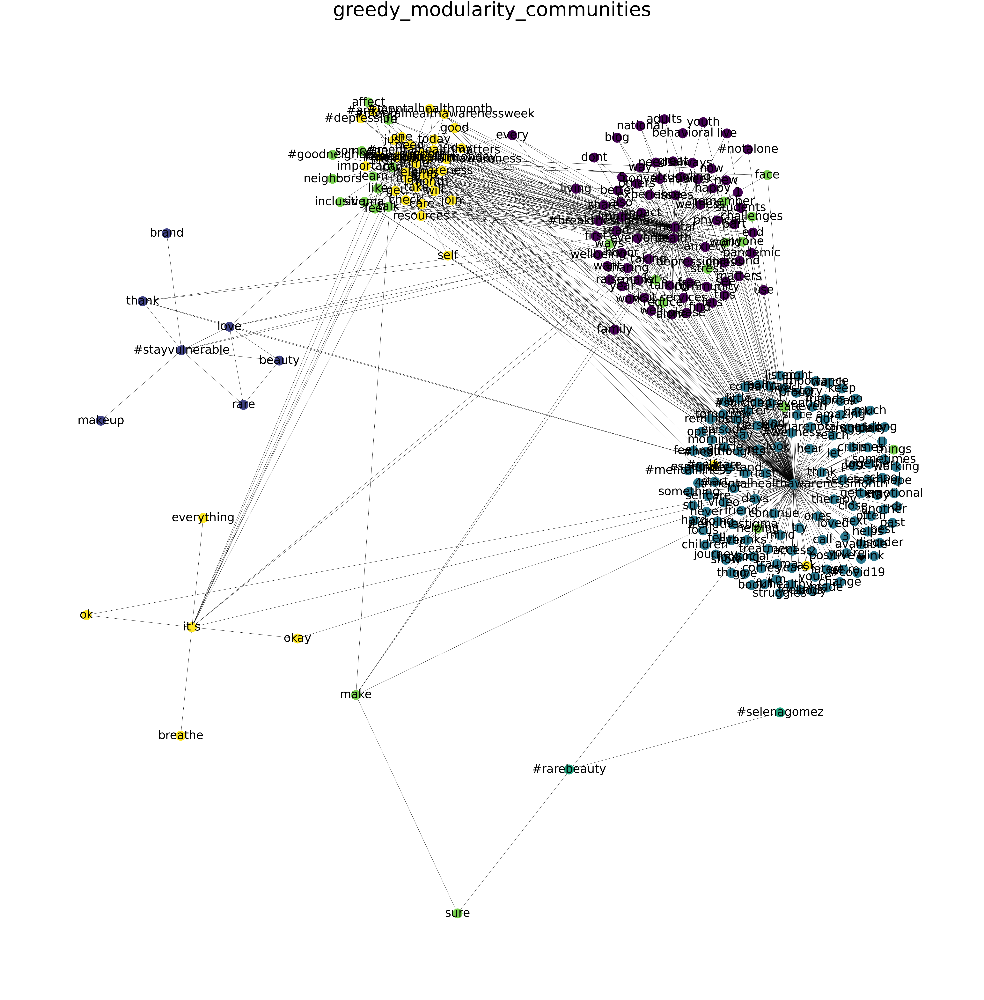

In [113]:
plt.figure(figsize=(70, 70))

pos = community_layout(G, greedy_modularity_communities_pos)

nx.draw(G, pos,with_labels=True,node_size=2500,font_size=60, node_color=list(partition.values()))
plt.title('greedy_modularity_communities',size=100) 
plt.show()

#uncomment next line to save the picture of this figure
#plt.savefig('plot_greedy_modularity_communities.png')